<div dir=rtl>

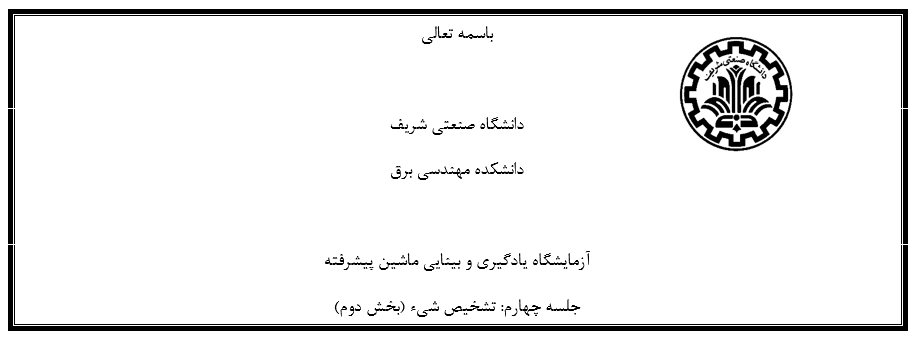

<div dir=rtl>

نام و نام‌خانوادگی: حامد آجورلو  

شماره دانشجویی: ۹۷۱۰۱۱۶۷

----



<div dir=rtl>

#  آزمايش اول: پياده سازی الگوريتم bounding box regression

----



<div dir=rtl>


در اين آزمايش با فرض محاسبه کادرهای پيشنهادی با استفاده از الگوريتم های تشخيص شیء،
می خواهيم کادرهای اصلاح شده را با استفاده رگرسيون کادر محاسبه کنيم.


برای دریافت دیتاست به لینک روبه رو مراجعه کنید:
 [دیتاست](https://drive.google.com/drive/folders/14Ahz4Zj6NhUgnwhNkCdQUX0Zr0Uextep?usp=sharing)


<div dir=rtl>

## 1.	آشنایی با دیتاست

همراه با ديتاست یک فايل annotation قرار دارد که که در آن 
مختصات واقعی و مختصات کادرهای پيش بينی شده برای تصوير آمده است.

با استفاده از کتابخانه opencv و pandas ، سه نمونه ابتدايی را همراه با کادرهای اصلی و کادرهای پيشبينی
شده رسم کنيد.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

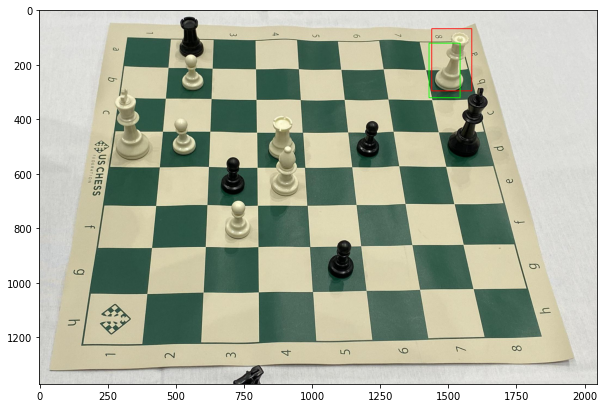

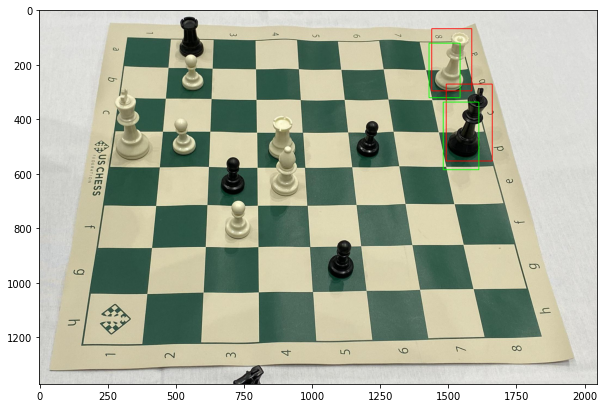

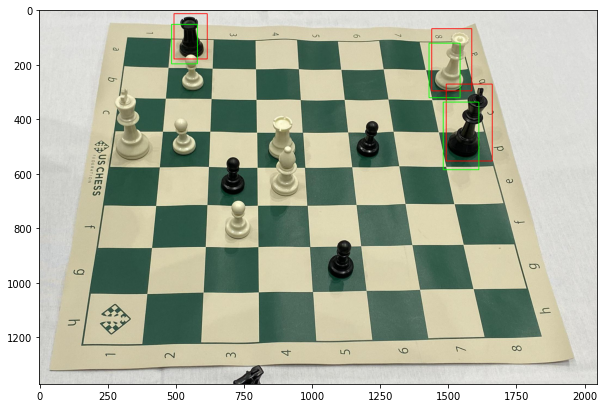

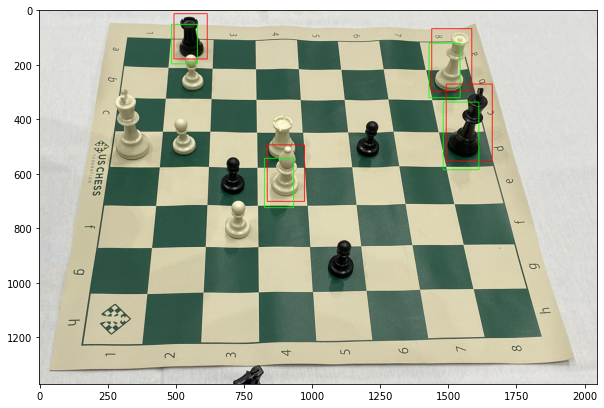

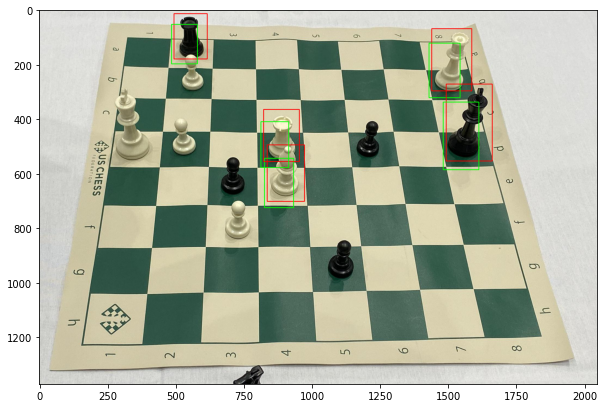

...

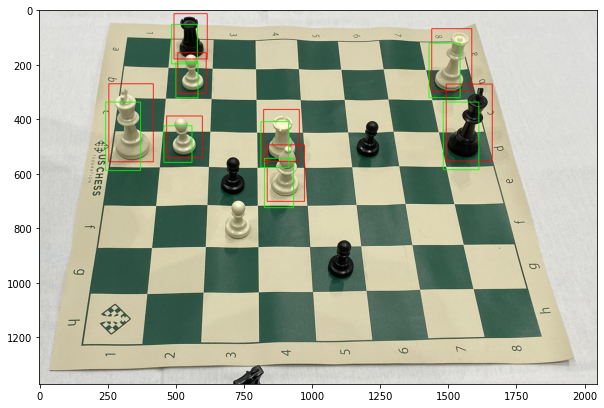

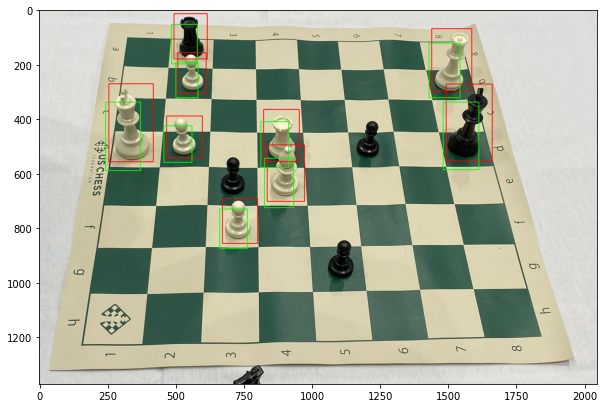

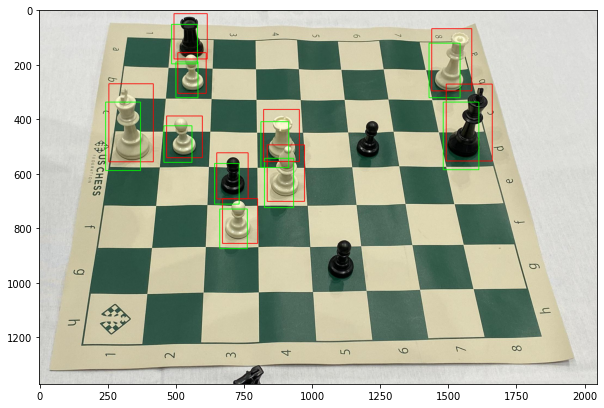

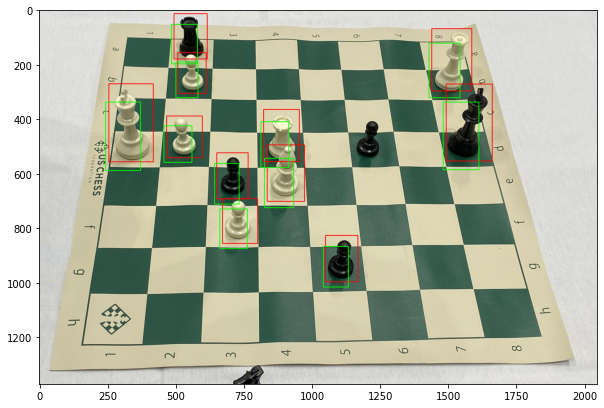

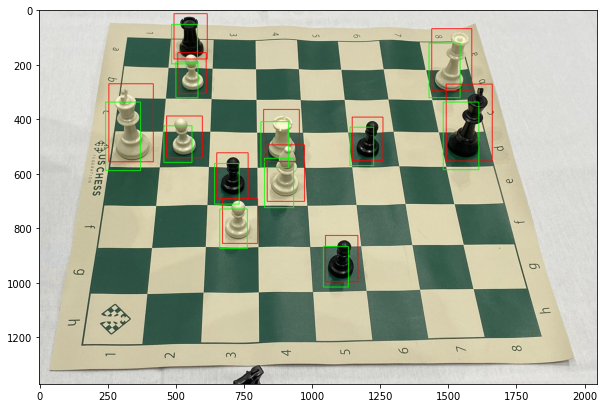

In [ ]:
########
import os,cv2,keras
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random


#### read boxes from annotation files
def real_rectangle(csv_annot):
  df = pd.read_csv(csv_annot)
  x_min=np.zeros(len(list(df['Unnamed: 0'])))
  y_min=np.zeros(len(list(df['Unnamed: 0'])))
  x_max=np.zeros(len(list(df['Unnamed: 0'])))
  y_max=np.zeros(len(list(df['Unnamed: 0'])))
  imagesList = list(np.zeros(len(list(df['Unnamed: 0']))))
  for j in range(len(list(df['Unnamed: 0']))):
    x_min[j]=int(df.iloc[j,5])
    y_min[j]=int(df.iloc[j,6])
    x_max[j]=int(df.iloc[j,7])
    y_max[j]=int(df.iloc[j,8])
    imagesList[j]=df.iloc[j,1][-6:-4]
    real_boxes = [x_min,y_min,x_max,y_max]
  return real_boxes , imagesList
  
def pred_rectangle(csv_annot):
  df = pd.read_csv(csv_annot)
  px_min=np.zeros(len(list(df['Unnamed: 0'])))
  py_min=np.zeros(len(list(df['Unnamed: 0'])))
  px_max=np.zeros(len(list(df['Unnamed: 0'])))
  py_max=np.zeros(len(list(df['Unnamed: 0'])))
  for j in range(len(list(df['Unnamed: 0']))):
    px_min[j]=int(df.iloc[j,9])
    py_min[j]=int(df.iloc[j,10])
    px_max[j]=int(df.iloc[j,11])
    py_max[j]=int(df.iloc[j,12])
  pred_boxes = [px_min,py_min,px_max,py_max]
  return pred_boxes , df['filename']


annotation_path ='/content/drive/MyDrive/Data/train/_annotations.csv'
dataset_path ='/content/drive/MyDrive/Data/train/'



#### get boxes
boxes_real , images_list = real_rectangle(annotation_path)
boxes_pred , Images= pred_rectangle(annotation_path)

#### read image 

ImagesDataset = {}
for img in Images:
    PATHWAY = dataset_path + '/' + img
    Im = plt.imread(PATHWAY)
    ImagesDataset[PATHWAY[-6:-4]] = Im



#### add boxes to image
for i in range(12):
  l = images_list[i]
  plt.figure(figsize=(10,20))
  CHESSBOARD=ImagesDataset[l]
  cv2.rectangle(CHESSBOARD,( int(boxes_real[0][i]),int(boxes_real[1][i])),(int(boxes_real[2][i]),int(boxes_real[3][i])),(255,0,0),2)
  cv2.rectangle(CHESSBOARD,( int(boxes_pred[0][i]),int(boxes_pred[1][i])),(int(boxes_pred[2][i]),int(boxes_pred[3][i])),(0,255,0),2)
  plt.imshow(CHESSBOARD)
  plt.show()



<div dir=rtl>

## 2.	تشکیل دیتاست

برای آموزش رگرسيون ابتدا نياز است ديتاست مناسب تشکيل شود، مطابق توضيحات
زير، با استفاده از تصاوير ورودی، يک ديتاست تشکيل دهيد:

* نواحی **پيش بينی** شده برای وجود اشيا را با استفاده از فايل annotation برای هر
تصوير استخراج کنيد.

* محاسبه بردار ورودی: يک شبکه مدل VGG تعريف کنيد و با اعمال هر ناحيه به عنوان ورودی
شبکه، خروجی لايه پولينگ پنجم را به عنوان بردار ويژگی محاسبه کنيد.(وزن های شبکه نياز به
آموزش نداشته و میتوانيد آنها را برابر “imagenet” قرار دهيد.)

* محاسبه خروجی ها: براساس کادرهای اصلی و کادرهای پيش بينی شده، بردار خروجی t را براساس
روابط زير تعريف کنيد:

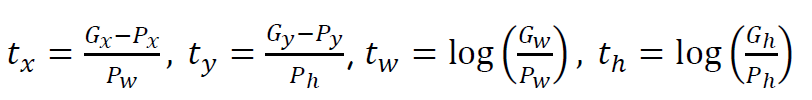

(برای توضيحات بيشتر میتوانيد به دستورکار 3 مراجعه کنيد)





In [ ]:
vggmodel = tf.keras.applications.vgg16.VGG16(
    include_top = True,
    weights = 'imagenet',
    input_tensor = None,
    input_shape = None,
    pooling = None,
    classes = 1000,
    classifier_activation = 'softmax'

)

x_out = vggmodel.layers[19].output

model=Model(inputs=vggmodel.input,outputs = x_out)
model.summary()

553476096/553467096 [==============================] - 6s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
### function to make dataset for each image
df = pd.read_csv('/content/drive/MyDrive/Data/train/_annotations.csv')
tx_train=np.zeros(len(list(df['Unnamed: 0'])))
ty_train=np.zeros(len(list(df['Unnamed: 0'])))
tw_train=np.zeros(len(list(df['Unnamed: 0'])))
th_train=np.zeros(len(list(df['Unnamed: 0'])))

def make_dataset(boxes_pred, img, j):
  CUT = img[int(boxes_pred[1][j]):int(boxes_pred[3][j]),int(boxes_pred[0][j]):int(boxes_pred[2][j]),:]
  resized = cv2.resize(CUT,(224,224),interpolation=cv2.INTER_AREA)
  img = np.expand_dims(resized,axis=0)
  return img 

df = pd.read_csv(annotation_path)
x_train=np.zeros((len(list(df['Unnamed: 0'])),25088))

for j in range(len(list(df['Unnamed: 0']))):
  l=images_list[j]
  CHESSBOARD = ImagesDataset[l]
  img = make_dataset(boxes_pred,CHESSBOARD,j)
  x_train[j,:]=model.predict(img)




<div dir=rtl>

## 3. رگرسيون ناحيه R-CNN: 

•	با استفاده از رگرسیون ridge‌، برای هر یک از خروجی‌ها، یک مدل آموزش دهید.

•	براساس مدل‌های به‌دست آمده، کادرهای اصلاح شده را برای 3 نمونه از داده‌های آموزش نشان داده و خطای آموزش را محاسبه کنيد.

•	براساس مدل‌های به‌دست آمده، کادرهای اصلاح شده را برای 3 نمونه از داده‌های تست نشان داده و خطای تست را محاسبه کنيد.


In [ ]:
for j in range(len(list(df['Unnamed: 0']))):
  Gx=(boxes_real[0][j]+boxes_real[2][j])/2
  Gy=(boxes_real[1][j]+boxes_real[3][j])/2
  Gw=(boxes_real[2][j]-boxes_real[0][j])
  Gh=(boxes_real[3][j]-boxes_real[1][j])

  Px = (boxes_pred[0][j]+boxes_pred[2][j])/2
  Py = (boxes_pred[1][j]+boxes_pred[3][j])/2
  Pw = (boxes_pred[2][j]-boxes_pred[0][j])
  Ph = (boxes_pred[3][j]-boxes_pred[1][j])

  tx_train[j]=(Gx-Px)/Pw
  ty_train[j]=(Gy-Py)/Ph
  tw_train[j]=np.log(Gw/Pw)
  th_train[j]=np.log(Gh/Ph)

In [ ]:
from sklearn.linear_model import Ridge

### define models
model_tx = Ridge(alpha=1)
model_ty = Ridge(alpha=1)
model_th =Ridge(alpha=1)
model_tw =Ridge(alpha=1)

### fit models

model_tx.fit(x_train,tx_train)
model_ty.fit(x_train,ty_train)
model_th.fit(x_train,th_train)
model_tw.fit(x_train,tw_train)


Ridge(alpha=1)

In [ ]:
T_x=[]
T_y=[]
T_w=[]
T_h=[]
for j in range(len(list(df['Unnamed: 0']))):
  l=images_list[j]
  CHESSBOARD = ImagesDataset[l]
  img = make_dataset(boxes_pred,CHESSBOARD,j)
  x_train[j,:]=model.predict(img)
for i in range(len(list(df['Unnamed: 0']))):
  l = images_list[i]
  CHESSBOARD = ImagesDataset[l]
  img = make_dataset(boxes_pred,CHESSBOARD,j)
  PREDICTED =model.predict(img)
  tx = model_tx.predict(PREDICTED)
  T_x.append(tx[0])
  ty = model_ty.predict(PREDICTED)
  T_y.append(ty[0])
  th = model_th.predict(PREDICTED)
  T_h.append(th[0])
  tw = model_tw.predict(PREDICTED)
  T_w.append(tw[0])

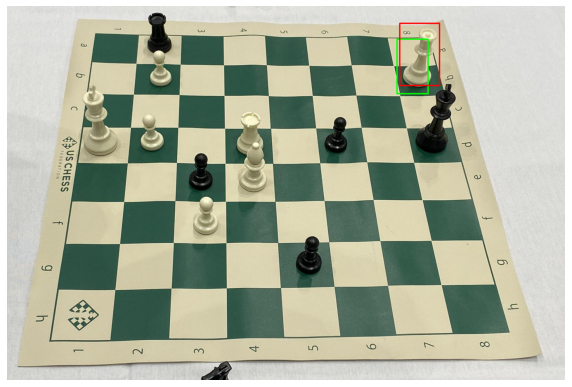

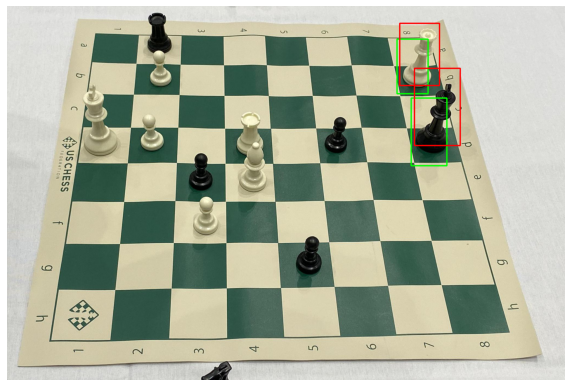

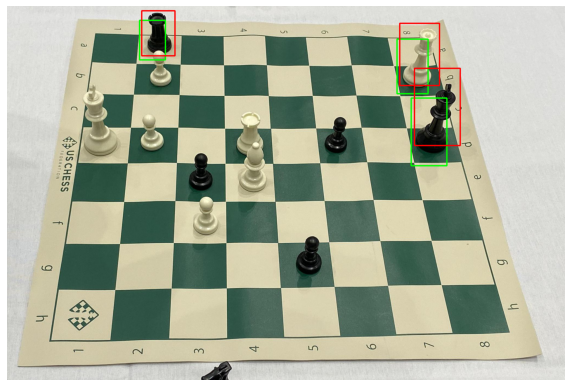

In [ ]:
ImagesDataset = {}
for img in Images:
    PATHWAY = dataset_path + '/' + img
    Im = plt.imread(PATHWAY)
    ImagesDataset[PATHWAY[-6:-4]] = Im

for i in range(3):
  l = images_list[i]
  CHESSBOARD=ImagesDataset[l]
  img = make_dataset(boxes_pred,CHESSBOARD,j)
  PREDICTED =model.predict(img)
  tx = model_tx.predict(PREDICTED)
  ty = model_ty.predict(PREDICTED)
  th = model_th.predict(PREDICTED)
  tw = model_tw.predict(PREDICTED)

  Px = (boxes_pred[0][i]+boxes_pred[2][i])/2
  Py = (boxes_pred[1][i]+boxes_pred[3][i])/2
  Pw = (boxes_pred[2][i]-boxes_pred[0][i])
  Ph = (boxes_pred[3][i]-boxes_pred[1][i])
  Gx = Pw * tx + Px 
  Gy = Py * ty + Py
  Gw = Pw * np.exp(tw) 
  Gh = Ph * np.exp(th)  
  RES1 = Gx - Gw/2
  RES2 = Gx + Gw/2
  RES3 = Gy - Gh/2
  RES4 = Gy + Gh/2

  cv2.rectangle(CHESSBOARD,(int(boxes_pred[0][i]),int(boxes_pred[1][i])),(int(boxes_pred[2][i]),int(boxes_pred[3][i])),(0,255,0),3)
  cv2.rectangle(CHESSBOARD, (int(RES1),int(RES3)) , (int(RES2),int(RES4)),(255,0,0),3)
  plt.figure(figsize=(10,20))
  plt.axis('off')
  plt.imshow(CHESSBOARD)
  plt.show()

In [ ]:
### train loss
TX_loss = mean_squared_error(tx_train,T_x)
TY_loss = mean_squared_error(ty_train,T_y)
TW_loss = mean_squared_error(tw_train,T_w)
TH_loss = mean_squared_error(th_train,T_h)

print("tx training LOSS ",TX_loss)
print("ty training LOSS ",TY_loss)
print("tw training LOSS ",TW_loss)
print("th training LOSS ",TH_loss)



tx training LOSS  2.1844215323792928e-05
ty training LOSS  7.312843737869698e-06
tw training LOSS  2.822363112693198e-05
th training LOSS  1.2828923861945241e-05


In [ ]:
TESTannotation_path ='/content/drive/MyDrive/Data/test/_annotations.csv'
TESTdataset_path ='/content/drive/MyDrive/Data/test'



#### get boxes
TESTboxes_real , TESTimages_list = real_rectangle(TESTannotation_path)
TESTboxes_pred , TESTImages= pred_rectangle(TESTannotation_path)

#### read image 

TESTImagesDataset = {}
for img in TESTImages:
    PATHWAY = TESTdataset_path + '/' + img
    Im = plt.imread(PATHWAY)
    TESTImagesDataset[PATHWAY[-6:-4]] = Im



In [ ]:
T_x=[]
T_y=[]
T_w=[]
T_h=[]
df = pd.read_csv(TESTannotation_path)
x_test=np.zeros((len(list(df['Unnamed: 0'])),25088))
for j in range(len(list(df['Unnamed: 0']))):
  l=TESTimages_list[j]
  CHESSBOARD = TESTImagesDataset[l]
  img = make_dataset(TESTboxes_pred,CHESSBOARD,j)
  x_test[j,:]=model.predict(img)

for i in range(len(list(df['Unnamed: 0']))):
  l = TESTimages_list[i]
  CHESSBOARD = TESTImagesDataset[l]
  img = make_dataset(TESTboxes_pred,CHESSBOARD,j)
  PREDICTED =model.predict(img)
  tx = model_tx.predict(PREDICTED)
  T_x.append(tx[0])
  ty = model_ty.predict(PREDICTED)
  T_y.append(ty[0])
  th = model_th.predict(PREDICTED)
  T_h.append(th[0])
  tw = model_tw.predict(PREDICTED)
  T_w.append(tw[0])

In [ ]:
df = pd.read_csv(TESTannotation_path)
tx_test=np.zeros(len(list(df['Unnamed: 0'])))
ty_test=np.zeros(len(list(df['Unnamed: 0'])))
tw_test=np.zeros(len(list(df['Unnamed: 0'])))
th_test=np.zeros(len(list(df['Unnamed: 0'])))
for j in range(len(list(df['Unnamed: 0']))):
  Gx=(TESTboxes_real[0][j]+TESTboxes_real[2][j])/2
  Gy=(TESTboxes_real[1][j]+TESTboxes_real[3][j])/2
  Gw=(TESTboxes_real[2][j]-TESTboxes_real[0][j])
  Gh=(TESTboxes_real[3][j]-TESTboxes_real[1][j])

  Px = (TESTboxes_pred[0][j]+TESTboxes_pred[2][j])/2
  Py = (TESTboxes_pred[1][j]+TESTboxes_pred[3][j])/2
  Pw = (TESTboxes_pred[2][j]-TESTboxes_pred[0][j])
  Ph = (TESTboxes_pred[3][j]-TESTboxes_pred[1][j])

  tx_test[j]=(Gx-Px)/Pw
  ty_test[j]=(Gy-Py)/Ph
  tw_test[j]=np.log(Gw/Pw)
  th_test[j]=np.log(Gh/Ph)

tx test LOSS  1.86120111762149e-05
ty test LOSS  9.702914892159834e-06
tw test LOSS  3.580188249254522e-05
th test LOSS  1.7543583097011906e-05


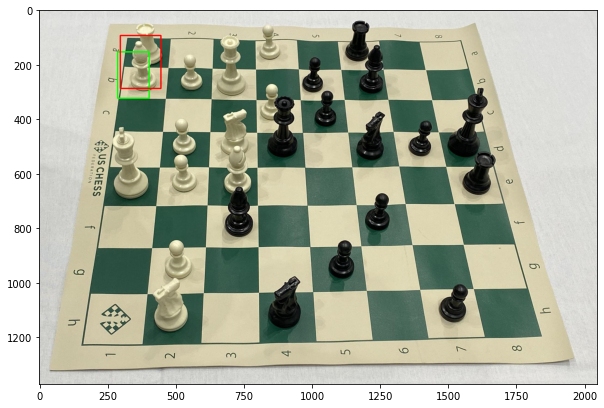

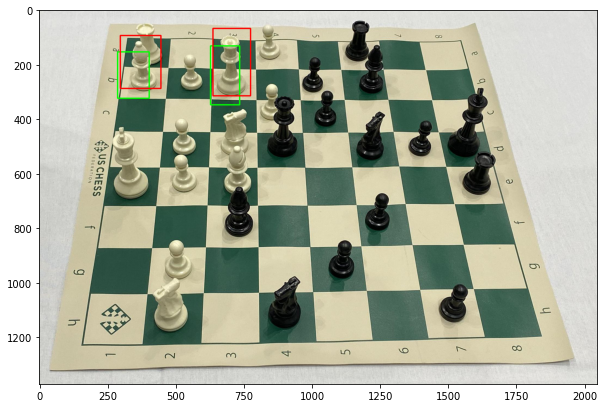

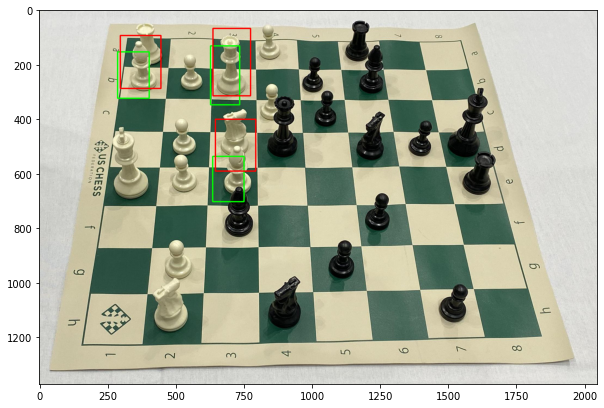

In [ ]:
### test loss
TESTTX_loss = mean_squared_error(tx_test,T_x)
TESTTY_loss = mean_squared_error(ty_test,T_y)
TESTTW_loss = mean_squared_error(tw_test,T_w)
TESTTH_loss = mean_squared_error(th_test,T_h)

print("tx test LOSS ",TESTTX_loss)
print("ty test LOSS ",TESTTY_loss)
print("tw test LOSS ",TESTTW_loss)
print("th test LOSS ",TESTTH_loss)


### show test result on 3 images
TESTImagesDataset = {}
for img in TESTImages:
    PATHWAY = TESTdataset_path + '/' + img
    Im = plt.imread(PATHWAY)
    TESTImagesDataset[PATHWAY[-6:-4]] = Im
for i in range(3):
  l = TESTimages_list[i]
  CHESSBOARD=TESTImagesDataset[l]
  img = make_dataset(TESTboxes_pred,CHESSBOARD,j)
  PREDICTED =model.predict(img)
  tx = model_tx.predict(PREDICTED)
  ty = model_ty.predict(PREDICTED)
  th = model_th.predict(PREDICTED)
  tw = model_tw.predict(PREDICTED)

  Px = (TESTboxes_pred[0][i]+TESTboxes_pred[2][i])/2
  Py = (TESTboxes_pred[1][i]+TESTboxes_pred[3][i])/2
  Pw = (TESTboxes_pred[2][i]-TESTboxes_pred[0][i])
  Ph = (TESTboxes_pred[3][i]-TESTboxes_pred[1][i])
  Gx = Pw * tx + Px 
  Gy = Py * ty + Py
  Gw = Pw * np.exp(tw) 
  Gh = Ph * np.exp(th)  
  RES1 = Gx - Gw/2
  RES2 = Gx + Gw/2
  RES3 = Gy - Gh/2
  RES4 = Gy + Gh/2

  cv2.rectangle(CHESSBOARD,(int(TESTboxes_pred[0][i]),int(TESTboxes_pred[1][i])),(int(TESTboxes_pred[2][i]),int(TESTboxes_pred[3][i])),(0,255,0),3)
  cv2.rectangle(CHESSBOARD, (int(RES1),int(RES3)) , (int(RES2),int(RES4)),(255,0,0),3)
  plt.figure(figsize=(10,20))
  plt.imshow(CHESSBOARD)
  plt.show()



<div dir=rtl>

#  آزمايش دوم: محاسبه نواحی پيشنهادی با استفاده از شبکه RPN

----



<div dir=rtl>


در اين آزمايش می‌خواهيم با استفاده از لنگرهای از پيش تعيين شده، نواحی پيشنهادی برای يک تصوير را محاسبه کنيم.

برای دریافت دیتاست به لینک روبه رو مراجعه کنید:
 [دیتاست](https://drive.google.com/drive/folders/1rpKsngKsVCcO05uXV5JPSU8kPgcRMru5?usp=sharing)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

<div dir=rtl>

## 1.	آشنایی با دیتاست

تصوير موجود در ديتاست را نمايش داده و کادرهای اصلی را که در فايل annotation قرار دارد، بر روی تصوير نمايش دهيد.



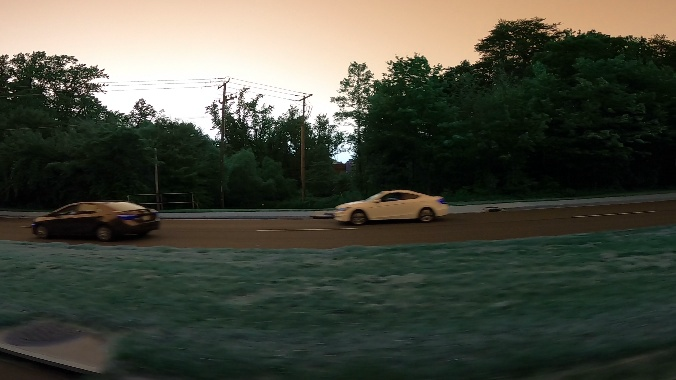

In [ ]:
# load the image
img = cv2.imread('/content/drive/MyDrive/Data2/test.jpg')
# change the format
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# plot image
cv2_imshow(img)


<div dir=rtl>

## 2.	تغییر سایز تصویر

ابعاد تصوير را به 800 * 800 
و موقعیت و ابعاد کادرها را متناسب با آن تغییر دهید.
تصویر نهایی را به همراه کادرها نمایش دهید.

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Data2/annotation.csv')

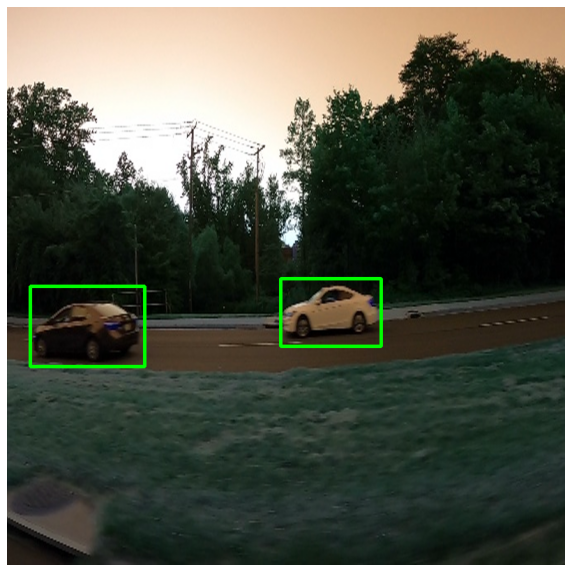

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Data2/annotation.csv')
img = cv2.imread('/content/drive/MyDrive/Data2/test.jpg')
# change the format
# ground truth box 

# visualize ground truth box
bbox_0 = np.zeros(2)
bbox_1 = np.zeros(2)
bbox_2 = np.zeros(2)
bbox_3 = np.zeros(2)

bbox_list=np.zeros((4,2))

for i in range(2):
  bbox_0[i]=int(df.iloc[i,1])
  bbox_1[i]=int(df.iloc[i,2])
  bbox_2[i]=int(df.iloc[i,3])
  bbox_3[i]=int(df.iloc[i,4])

for i in range(2):
  bbox_list[0][i]=int(df.iloc[i,1])
  bbox_list[1][i]=int(df.iloc[i,2])
  bbox_list[2][i]=int(df.iloc[i,3])
  bbox_list[3][i]=int(df.iloc[i,4])

h = 800
w = 800
H = np.shape(img)[0]
W = np.shape(img)[1]
# resize input to 800 x 800 

img = cv2.resize(img, dsize=(w, h), interpolation=cv2.INTER_CUBIC)

for i in range(4):
  bbox_list[i]=[int(i) for i in bbox_list[i]]
# compress or expand ground truth box
bbox_0 = w/W*bbox_0
bbox_2 = w/W*bbox_2
bbox_1 = h/H*bbox_1
bbox_3 = h/H*bbox_3


# visualize resized ground truth box
img_ = np.copy(img)
for i in range(2):
  cv2.rectangle(img_,(int(bbox_0[i]),int(bbox_1[i])),(int(bbox_2[i]),int(bbox_3[i])),(0,255,0),3) 
plt.figure(figsize=(10,20))
plt.axis('off')
plt.imshow(img_)
plt.show() 

<div dir=rtl>

## 3.	تعريف لنگرها: 

•	ابتدا 2500 مرکز برای لنگرها را به‌صورت يکنواخت محاسبه کرده و بر روی تصوير نمايش دهيد.

•	برای هر مرکز، 9 لنگر با نسبت‌های طول به عرض 0.5، 1، 2 و مقياس  322، 642 و 1282  تعريف کنيد.

•	9 لنگر مرکزی را بر روی تصوير نمايش دهيد.



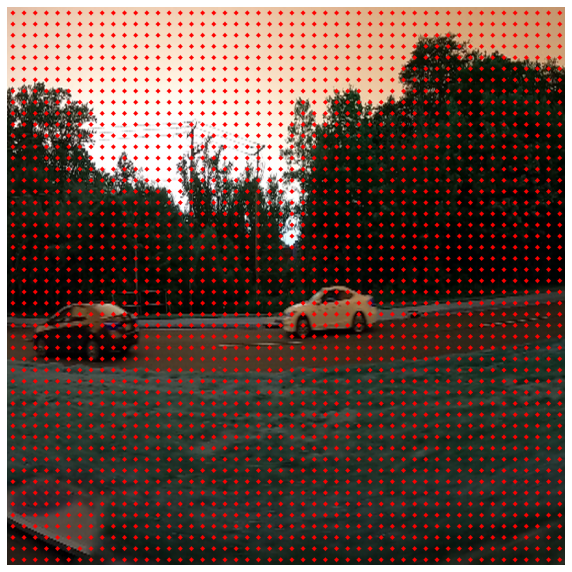

In [ ]:
# generating these 2500 centers on the image 
n_anchor_pos = 2500
# width stride on the image
x_stride = round(w/(np.sqrt(n_anchor_pos)+1))
y_stride = round(w/(np.sqrt(n_anchor_pos)+1))

# center of anchor location on image
x_center = np.arange( int(x_stride/2), int(w-x_stride/2) +1 ,x_stride )
y_center = np.arange(  int(y_stride/2), int(h-y_stride/2) +1 ,y_stride ) 

# generate all the ordered pair of x and y center
center_list = np.meshgrid(x_center,y_center)
center_list = np.reshape(center_list,(2,n_anchor_pos)).T
# visualizing the anchor positions
img_ = np.copy(img)
plt.figure(figsize=(10,20))
for i in range(n_anchor_pos):
    center = (int(center_list[i,0]),int(center_list[i,1]))
    cv2.circle(img_,center,1,(255,0,0),3  ) 
plt.imshow(img_)
plt.axis('off')
plt.show()

In [ ]:
# aspect ratio = width/ height
h=800
w=800
anchor_ratio_list = [0.5, 1, 2] 
# area of each anchor box
anchor_scale_list = [16, 64, 128] 

# total possible anchors 
n_anchors = len(center_list)*len(anchor_ratio_list)*len(anchor_scale_list)

# number of car in the image
n_object = len(bbox_0)

anchor_list = np.zeros(shape= (n_anchors, 4))
  
count = 0

for i in range(len(center_list)):
    center_x, center_y = center_list[i,0], center_list[i,1]
    # for each ratio
    for ratio in anchor_ratio_list:
        # for each scale
        for scale in anchor_scale_list:
            #compute height and width and scale them by constant factor
            r = np.sqrt(ratio)
            h_r = int(scale*r) 
            w_r = int(scale/r)


            #putting anchor 9 boxes at each anchor locations
            anchor_xmin =  max(center_x-int(w_r/2),0)
            anchor_ymin =  max(center_y-int(h_r/2),0)
            anchor_xmax =  min(center_x+int(w_r/2),w)
            anchor_ymax =  min(center_y+int(h_r/2),h)
            # append the anchor box to anchor list
            anchor_list[count,:] =[anchor_xmin,anchor_ymin,anchor_xmax,anchor_ymax]  
            count += 1

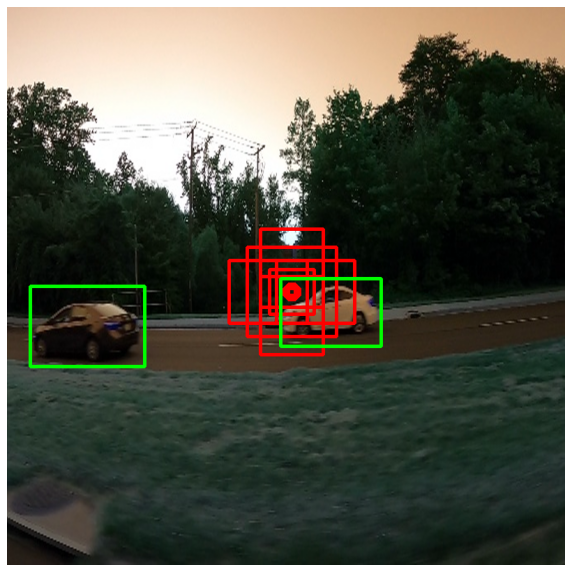

In [ ]:
# visualize anchor boxs at center anchor location
img_ = np.copy(img)
for i in range(9*1275,9*1276):  
    x_min = anchor_list[i,0]
    y_min = anchor_list[i,1]
    x_max = anchor_list[i,2]
    y_max = anchor_list[i,3]
    cv2.rectangle(img_, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color=(255, 0, 0), thickness=3) 

for i in range(2):
  cv2.rectangle(img_,(int(bbox_0[i]),int(bbox_1[i])),(int(bbox_2[i]),int(bbox_3[i])),(0,255,0),3) 
plt.figure(figsize=(10,20))
plt.imshow(img_)
plt.axis('off')
plt.show()

<div dir=rtl>

## 4. محاسبه لنگرها با حداکثر اشتراک

براساس تعريف IOU، لنگرهایی که بالاترين اشتراک را با کادرهای اصلی دارد، محاسبه کرده و بر روی تصوير نمايش دهيد.

In [ ]:
#Compute overlap (IOU) between box1 and box2
def get_iou(bb1, bb2):

  xA = max(int(bb1[0]), int(bb2[0]))
  yA = max(int(bb1[1]), int(bb2[1]))
  xB = min(int(bb1[2]), int(bb2[2]))
  yB = min(int(bb1[3]), int(bb2[3]))
  interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

  boxAArea = (int(bb1[2]) - int(bb1[0]) + 1) * (int(bb1[3]) - int(bb1[1]) + 1)
  boxBArea = (int(bb2[2]) - int(bb2[0]) + 1) * (int(bb2[3]) - int(bb2[1]) + 1)

  iou = interArea / float(boxAArea + boxBArea - interArea)
  return iou

In [ ]:
# computing IOU for each anchor boxes with each ground truth box
iou_list = np.zeros((n_anchors, n_object))

for i in range(n_anchors):

  selectedANCHOR=anchor_list[i,:]
  selectedANCHOR = [int(i) for i in selectedANCHOR]
  # print(b)
  for j in range(2):
    box = [bbox_0[j],bbox_1[j],bbox_2[j],bbox_3[j]]
    box = [int(i) for i in box]
    # print(b1)
    iou_list[i,j]=get_iou(selectedANCHOR,box)



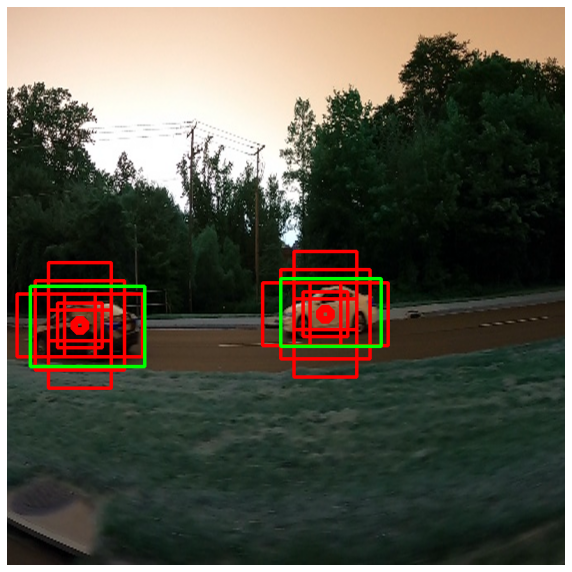

In [ ]:
# visualizing top anchor boxes
img_ = np.copy(img)

# top anchor box
img_ = np.copy(img)
for i in range(9*1406,9*1407):  
    x_min = anchor_list[i,0]
    y_min = anchor_list[i,1]
    x_max = anchor_list[i,2]
    y_max = anchor_list[i,3]
    cv2.rectangle(img_, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color=(255, 0, 0), thickness=3) 
for i in range(9*1378,9*1379):  
    x_min = anchor_list[i,0]
    y_min = anchor_list[i,1]
    x_max = anchor_list[i,2]
    y_max = anchor_list[i,3]
    cv2.rectangle(img_, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color=(255, 0, 0), thickness=3) 
for i in range(2):
    cv2.rectangle(img_, (int(bbox_0[i]),int(bbox_1[i])), (int(bbox_2[i]),int(bbox_3[i])), color=(0, 255, 0), thickness=3)  

plt.figure(figsize=(10,20))
plt.imshow(img_)
plt.axis('off')
plt.show()




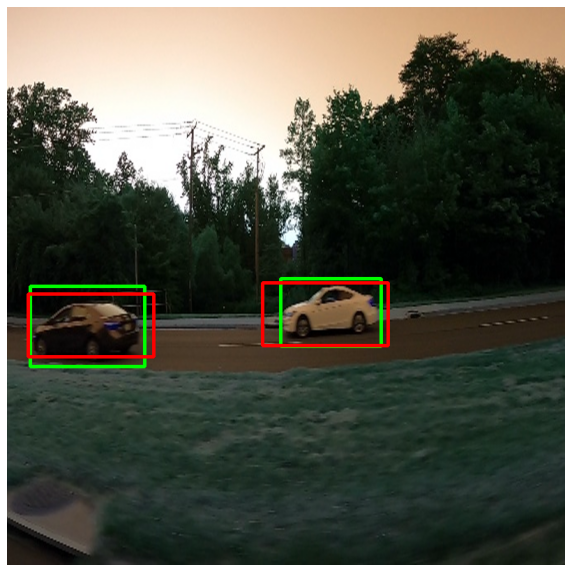

In [ ]:

img_ = np.copy(img)

# ground truth box
for i in range(2):
    cv2.rectangle(img_, (int(bbox_0[i]),int(bbox_1[i])), (int(bbox_2[i]),int(bbox_3[i])), color=(0, 255, 0), thickness=3)
    ARG_max = np.argmax(iou_list[:,i])
    Selectedxmin = anchor_list[ARG_max,0]
    Selectedymin = anchor_list[ARG_max,1]
    Selectedxmax = anchor_list[ARG_max,2]
    Selectedymax = anchor_list[ARG_max,3]
    cv2.rectangle(img_, (int(Selectedxmin),int(Selectedymin)), (int(Selectedxmax),int(Selectedymax)), color=(255,0,0), thickness=3)

plt.figure(figsize=(10,20))
plt.imshow(img_)
plt.axis('off')
plt.show()

<div dir=rtl>

## 5. محاسبه لیبل‌ها

هر یک از لنگرها را براساس IOU با کادرهای اصلی، لیبل ۰ یا ۱ اختصاص دهید.

•	لیبل ۱: اگر IOU با کادرهای اصلی بیشتر از ۰.۷ باشد.

•	لیبل ۰: اگر IOU با کادرهای اصلی کمتر از ۰.۳ باشد.



In [ ]:
# labeling each anchor box based on IOU threshold

Labels = np.zeros(n_anchors)

for i in range(n_anchors):
  if(np.max(iou_list[i,:])>0.7):
    Labels[i] = 1

  if(np.max(iou_list[i,:])<0.3):
    Labels[i] = -1






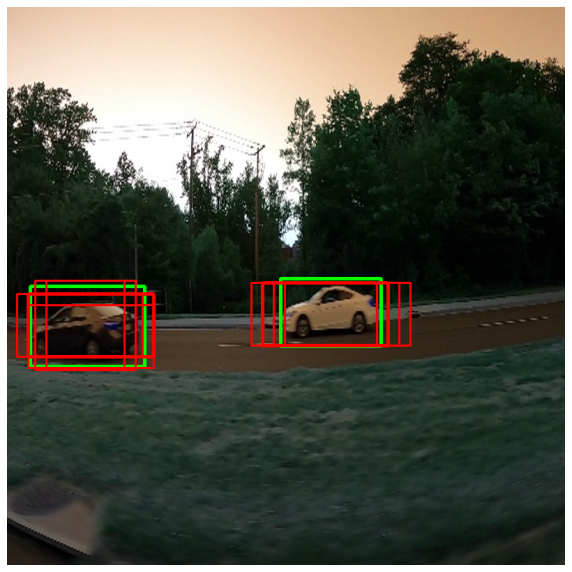

In [ ]:
img = np.copy(img)

for i in range(n_anchors):
  if(Labels[i] == 1):
    Selectedxmin = anchor_list[i,0]
    Selectedymin = anchor_list[i,1]
    Selectedxmax = anchor_list[i,2]
    Selectedymax = anchor_list[i,3]
    cv2.rectangle(img_,(int(Selectedxmin),int(Selectedymin)),(int(Selectedxmax),int(Selectedymax)),(255,0,0),2)
plt.figure(figsize=(10,20))
plt.imshow(img_)
plt.axis('off')
plt.show()
